In [1]:
import slideio
from utils import get_test_images, display_driver_test_image_info 
from utils import show_images, show_image, get_driver_test_images
from utils import show_scene_info, show_scenes, show_volume
from IPython.display import display
import json
import pandas as pd
import random
import json
import matplotlib.pyplot as plt
import numpy as np

# Test images
For the future demonstration of the library, we will be utilizing some test images. Information regarding the images and the drivers required for image processing is stored in the *image.json* file. The helper utility *get_test_images* loads this image information into a list for convenient access and utilization during the demonstration.

In [2]:
images = get_driver_test_images('DCM')
display_driver_test_image_info(images, 'DCM', True)

Image Path,Driver,Options
./images/US-RGB-8-epicard,DCM,"['SINGLE-FRAME', 'JPEG']"
./images/OT-MONO2-8-colon.dcm,DCM,"['SINGLE-FRAME', 'NOT-COMPRESSED']"
./images/SC1_JLSN.dcm,DCM,"['SINGLE-FRAME', 'JLSN']"
./images/CT1_J2KI,DCM,"['SINGLE-FRAME', 'JPEG2000']"
./images/MR-MONO2-8-16x-heart,DCM,['Z-STACK']
./images/GSPS_Liver/DICOMDIR,DCM,"['DICOMDIR', 'Z-STACK']"
./images/BPAEC,DCM,['WSI']
./images/FluorCell_4,DCM,['WSI']
./images/FluorCell_4/3_0,DCM,"['WSI', 'SINGLE-LEVEL']"


# Support of multi-dimensional DICOM slides

In [3]:
def extract_image_properties(slides):
    image_infos = []
    for image in slides:
        image_info = {}
        slide = slideio.open_slide(image['path'],"DCM")
        scene = slide.get_scene(0)
        image_info['Path'] = image['path']
        image_info['Num Channels'] = scene.num_channels
        image_info['Data Type'] = scene.get_channel_data_type(0)
        image_info['Compression'] = str(scene.compression).replace('Compression.','')
        image_info['Width'] = scene.size[0]
        image_info['Height'] = scene.size[1]
        image_info['Z Slices'] = scene.num_z_slices
        image_info['Z Frames'] = scene.num_t_frames
        modality = 'Unknown'
        raw_metadata = scene.get_raw_metadata()
        if raw_metadata and len(raw_metadata)>0:
            metadata = json.loads(raw_metadata)
            if '00080060' in metadata:
                modality = metadata['00080060']['Value'][0]
        image_info['Modality'] = modality
        image_infos.append(image_info)
    return pd.DataFrame(image_infos)

def extract_scenes(slides):
    return [slideio.open_slide(slide['path'],'DCM').get_scene(0) for slide in slides]

In [4]:
z_frame_slides = [image for image in images if 'Z-STACK' in image['options']]
extract_image_properties(z_frame_slides)

W: processing MR image ... applying modality transform may create unexpected result
W: processing MR image ... applying modality transform may create unexpected result
W: processing MR image ... applying modality transform may create unexpected result
W: processing MR image ... applying modality transform may create unexpected result
W: processing MR image ... applying modality transform may create unexpected result
W: processing MR image ... applying modality transform may create unexpected result
W: processing MR image ... applying modality transform may create unexpected result
W: processing MR image ... applying modality transform may create unexpected result
W: processing MR image ... applying modality transform may create unexpected result
W: processing MR image ... applying modality transform may create unexpected result
W: processing MR image ... applying modality transform may create unexpected result
W: processing MR image ... applying modality transform may create unexpected

,Path,Num Channels,Data Type,Compression,Width,Height,Z Slices,Z Frames,Modality
0,./images/MR-MONO2-8-16x-heart,1,uint8,Uncompressed,256,256,16,1,MR
1,./images/GSPS_Liver/DICOMDIR,1,uint16,Uncompressed,480,480,25,1,MR


W: processing MR image ... applying modality transform may create unexpected result
W: processing MR image ... applying modality transform may create unexpected result
W: processing MR image ... applying modality transform may create unexpected result
W: processing MR image ... applying modality transform may create unexpected result
W: processing MR image ... applying modality transform may create unexpected result
W: processing MR image ... applying modality transform may create unexpected result
W: processing MR image ... applying modality transform may create unexpected result
W: processing MR image ... applying modality transform may create unexpected result
W: processing MR image ... applying modality transform may create unexpected result
W: processing MR image ... applying modality transform may create unexpected result
W: processing MR image ... applying modality transform may create unexpected result
W: processing MR image ... applying modality transform may create unexpected

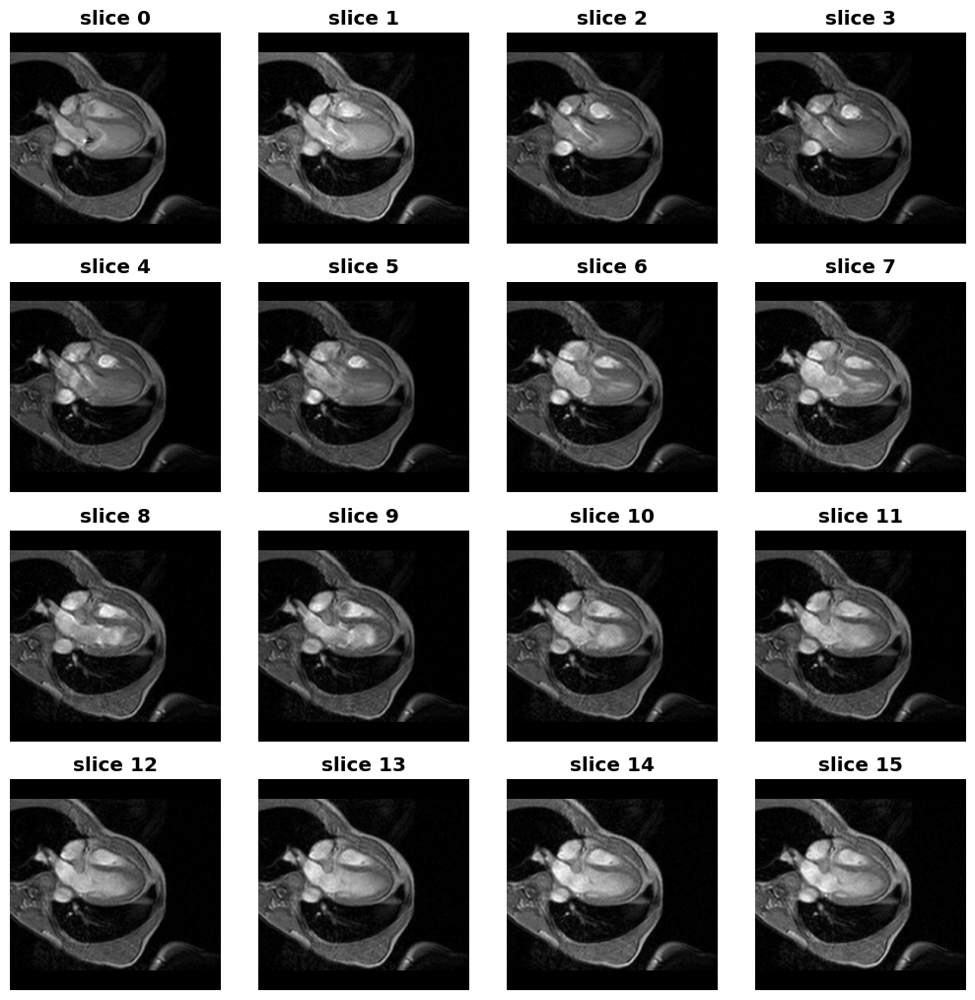

In [5]:
scenes = extract_scenes(z_frame_slides)
scene = scenes[0]
slices = []
titles = []
for z in range(scene.num_z_slices):
    slice = scene.read_block(slices=(z,z+1)) # read a range of slices from first_slice to last_slice - 1: [first_slice, last_slice) 
    slices.append(slice)
    titles.append(f"slice {z}")
show_images(slices, titles, 256)

In [6]:
scene = scenes[0]
volume = scene.read_block(size=(150,0), slices=(0,scene.num_z_slices))

In [7]:
show_volume(volume)